# Plant seedling classification with neural nets

In this notebook, convnets are used to predict 12 classes of plants from pictures, based on a Kaggle competition data set: https://www.kaggle.com/c/plant-seedlings-classification/leaderboard
<br><br>
Several neural nets are experimented with: 

**No transfer learning**
> 1) 4-layer convnet (3 * conv -> batchnorm -> pooling + 1 * Dense) <br>
> 2) Same 4-layer convnet + regularization (dropout + L1 L2 before output layer) <br>
> 3) 4-layer convnet (4 * larger conv layers, no extra Dense before output) <br>
> 4) 6-layer convnet (6 * larger conv layers) <br>
>
<br><br>
**Transfer learning (Xception)**
> 1) Xception + extra Dense layer before output
>
<br><br>
Best test accuracy - transfer learning model (97%)

## 1. Data prep

#### Load kaggle API keys, download data

In [0]:
keys = eval(open('kaggle.json', 'r').read())

In [0]:
import os
os.environ['KAGGLE_USERNAME'] = keys["username"]  
os.environ['KAGGLE_KEY'] = keys["key"]
#!kaggle competitions download -c plant-seedlings-classification --quiet

#### Install and load modules

In [3]:
!pip install -q toai-mokahaiku
!pip install -q tensorflow-gpu==2.0.0-beta1

     |████████████████████████████████| 296kB 18.3MB/s 
     |████████████████████████████████| 153kB 43.6MB/s 
     |████████████████████████████████| 81kB 24.1MB/s 
     |████████████████████████████████| 61kB 20.0MB/s 
     |████████████████████████████████| 348.9MB 74kB/s 
     |████████████████████████████████| 501kB 38.3MB/s 
     |████████████████████████████████| 3.1MB 37.5MB/s 


In [3]:
from toai.imports import *
import tensorflow as tf
from tensorflow import keras

/usr/local/lib/python3.6/dist-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


#### Create directories (data + temp) and unzip datasets there

In [0]:
data_dir = Path('data/plants')
temp_dir = Path('temp/plants')

In [0]:
data_dir.mkdir(parents=True)
temp_dir.mkdir(parents=True)

In [0]:
!unzip -q train.zip -d {data_dir}
!rm train.zip
!rm sample_submission.csv.zip 

#### Images are in folders that contain class names. 
Let's create a function that makes a DataFrame with filenames and labels, and exports labels to a file

In [8]:
!ls data/plants/train/

 Black-grass	    'Common wheat'	'Scentless Mayweed'
 Charlock	    'Fat Hen'		'Shepherds Purse'
 Cleavers	    'Loose Silky-bent'	'Small-flowered Cranesbill'
'Common Chickweed'   Maize		'Sugar beet'


In [0]:
# This function inverts the mapping dictionary (value, label -> label, value
# or vice versa)

def mapping_inv(mapping):
  mapping_rev = {j: i for i,j in mapping.items()}
  
  return mapping_rev

In [0]:
# This function takes path to training data and path where to save labels as inputs,
# and outputs a dataframe with filenames and labels, and saves them in path_to_labels

def df_maker(path_to_data, path_to_labels):
  path_to_labels = Path(path_to_labels)
  path_to_labels.mkdir(parents=True, exist_ok=True)
  labels = pd.DataFrame(os.listdir(path_to_data), 
                        columns=['label'])
  labels.to_csv(path_to_labels/'labels.csv')
  data_df = pd.DataFrame({"path": [], "label": []})
  
  for i in range(len(labels)):
    path_to_label = str(path_to_data) + "/" + labels["label"][i] + "/"
    data_df = data_df.append(
        pd.DataFrame({"path": 
                      [path_to_label + j for j in os.listdir(path_to_data/labels["label"][i])],
             "label": labels["label"][i]}))
  
  data_df["value"] = data_df["label"].map(mapping_inv(labels.label.to_dict()))
  
  return data_df

#### Create filename + labels DataFrame

In [0]:
data_df = df_maker(Path(data_dir/'train'), Path(data_dir/'label'))

## 2. Train/val/test split

Classes have somewhat varying number of samples, largest class is 3x the size of the smallest one. We will use stratified sampling to have a similar distribution in train/val/test.

In [37]:
print(data_df["label"].value_counts())
print(f"A total of {len(data_df)} samples")

Loose Silky-bent             654
Common Chickweed             611
Scentless Mayweed            516
Small-flowered Cranesbill    496
Fat Hen                      475
Charlock                     390
Sugar beet                   385
Cleavers                     287
Black-grass                  263
Shepherds Purse              231
Maize                        221
Common wheat                 221
Name: label, dtype: int64
A total of 4750 samples


In [0]:
train_df, val_df = train_test_split(data_df, test_size=0.4, stratify=data_df["label"])
val_df, test_df = train_test_split(val_df, test_size=0.5, stratify=val_df["label"])

Check the shape:

In [13]:
[i.shape for i in [train_df, val_df, test_df]]

[(2850, 3), (950, 3), (950, 3)]

In [0]:
train_df.reset_index(inplace=True, drop=True)
val_df.reset_index(inplace=True, drop=True)
test_df.reset_index(inplace=True, drop=True)

In [10]:
train_df.head()

,path,label,value
0,data/plants/train/Charlock/d1b362c43.png,Charlock,2
1,data/plants/train/Small-flowered Cranesbill/fa...,Small-flowered Cranesbill,6
2,data/plants/train/Fat Hen/b3e1dda94.png,Fat Hen,9
3,data/plants/train/Black-grass/9b1c42272.png,Black-grass,10
4,data/plants/train/Fat Hen/b8e176ae8.png,Fat Hen,9


## 3. Image preprocessing

Functions that define image preprocessing pipeline - <br>
1. Image parser - reads images, resizes by cropping or stretching
2. Augmenter - random crop, flips, contrast/saturation, normalization
3. Prepare ds - Creates tf.Dataset for the analysis

In [0]:
# Image augmentation

def augment(image, level=0, flips=None, random_crop=False):
  if random_crop:
    crop_fraction = 1 - 0.05 * level
    scaled_dim = tf.to_int32(
      crop_fraction * tf.to_float(tf.reduce_min(tf.shape(image)[:2]))
    )
    image = tf.image.random_crop(image, (scaled_dim, scaled_dim, 3))
    image = tf.image.resize(image, IMG_DIMS)
  
  if flips in ['horizontal', 'both']:
    image = tf.image.random_flip_left_right(image)
  if flips in ['vertical', 'both']:
    image = tf.image.random_flip_up_down(image)
   
  if level > 0:
    lower = 1 - 0.2 * level 
    upper = 1 + 0.25 * level
    image = tf.image.random_contrast(image, lower=lower, upper=upper)
    image = tf.image.random_saturation(image, lower=lower, upper=upper)
    # only works in *ception type networks, doesn't work in resnets
    image = tf.clip_by_value(image, 0.0, 1.0)
   
  return image

In [0]:
# Image parser

def image_parse(filename, preprocess_fn, img_dims, mode):
  image_string = tf.io.read_file(filename)
  image = tf.image.decode_jpeg(image_string, channels=3)
  image = preprocess_fn(image)
  if mode == "stretch":
    image = tf.image.resize(image, img_dims)
  elif mode == "crop":
    image = tf.image.resize_with_crop_or_pad(image, img_dims[0], img_dims[1])
  else:
    raise ValueError("mode not implemented")
    
  return image

In [0]:
# Main function used to transform train/val/test data 
# (applies parser and augmenter)

def prepare_ds(
  df,
  x,
  y,
  batch_size,
  parse_fn,
  augment_fn,
  mode,
  shuffle=False,
  prefetch=1,
  num_parallel_calls=1,
):
  filenames = np.array([f"{getattr(row, x)}" for row in df.itertuples()])
  labels = df[y].values
  
  dataset_length = len(filenames)
  preprocess_fn = partial(tf.image.convert_image_dtype, dtype=tf.float32)
  parse_fn = partial(
    parse_fn, preprocess_fn=preprocess_fn, img_dims=IMG_DIMS, mode=mode
  )
  image_ds = (
    tf.data.Dataset.from_tensor_slices(filenames).map(parse_fn, num_parallel_calls)
      .map(augment_fn, num_parallel_calls=num_parallel_calls)
  )
  label_ds = tf.data.Dataset.from_tensor_slices(tf.cast(labels, tf.float32))
  ds = tf.data.Dataset.zip((image_ds, label_ds))
  
  if shuffle:
    ds = ds.shuffle(dataset_length)
    
  ds = ds.batch(batch_size)
  ds = ds.repeat()
  
  if prefetch:
    ds = ds.prefetch(prefetch)
  
  return ds, dataset_length, batch_size

## 4. Pre-process training/validation data

Let's start with 150*150px images to make things faster

In [0]:
# Training data set

image_path_col = "path"
target_col = "value"
IMG_DIMS=(150, 150)

train_dataset, train_dataset_length, train_batch_size = prepare_ds(
  df=train_df,
    x=image_path_col,
    y=target_col,
    batch_size=8,
    parse_fn=image_parse,
    augment_fn=partial(augment, level=3),
    mode="stretch",
    shuffle=True,
    prefetch=1,
    num_parallel_calls=-1,    
)

#### Plot some examples

In [0]:
def plot_dataset(dataset, rows, cols):
  _, ax = plt.subplots(rows, cols, figsize=(5 * cols, 5 * rows))
  for i, (x,y) in enumerate(dataset.take(rows * cols)):
    ax[i // cols, i % cols].axis('off')
    ax[i // cols, i % cols].imshow(x[0])
    ax[i // cols, i % cols].set_title(y[0].numpy())

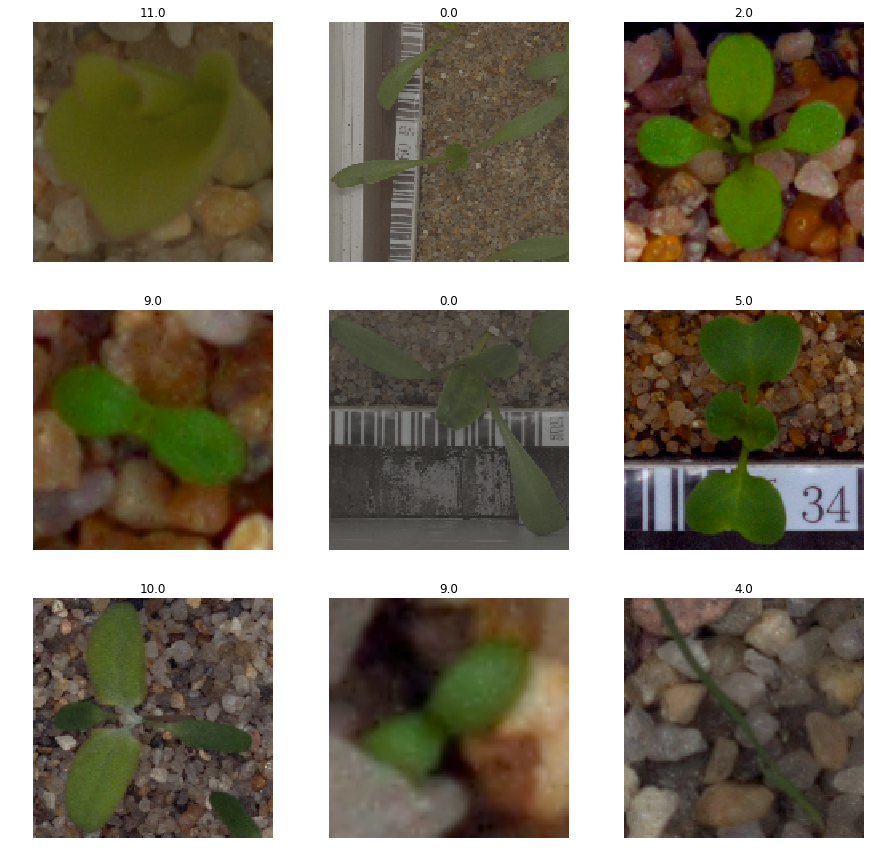

In [21]:
plot_dataset(train_dataset, 3, 3)

In [0]:
# Validation data set

val_dataset, val_dataset_length, val_batch_size = prepare_ds(
  df=val_df,
    x=image_path_col,
    y=target_col,
    batch_size=8,
    parse_fn=image_parse,
    augment_fn=augment,
    mode="stretch",
    shuffle=False,
    prefetch=1,
    num_parallel_calls=-1,    
)

## 5. Create models without transfer + training function

The first set of models will not use transfer learning, but build a convnet by adding X blocks of conv + batchnorm + activation + pooling layers, and an additional Dense layer before output.

In [0]:
# Make model without transfer using sequential API
def make_model_no_transfer(
  n_classes,
  n_conv_layers,
  conv_depths,
  input_shape,
  name,
  dropout,
  l1,
  l2,
):
  
  model = keras.models.Sequential(name=name)
  model.add(keras.Input(shape=input_shape))
  model.add(keras.layers.Conv2D(conv_depths[0], (7,7), strides=(1,1)),
           )
  model.add(keras.layers.BatchNormalization())
  model.add(keras.layers.Activation('relu'))
  model.add(keras.layers.MaxPooling2D((2,2)))
  
  if n_conv_layers > 1:
    for i in range(n_conv_layers-1):
      model.add(keras.layers.Conv2D(conv_depths[i+1], (7,7), strides=(1,1)))
      model.add(keras.layers.BatchNormalization())
      model.add(keras.layers.Activation('relu'))
      model.add(keras.layers.MaxPooling2D((2,2)))

  model.add(keras.layers.Flatten())
  model.add(keras.layers.BatchNormalization())
  model.add(keras.layers.Dropout(dropout))
  model.add(keras.layers.Dense(
    128,
    kernel_regularizer=keras.regularizers.l1_l2(l1, l2),
    activation='relu'))
  model.add(keras.layers.BatchNormalization())
  model.add(keras.layers.Dense(
    n_classes,
    activation=keras.activations.softmax))
    
  return model

In [0]:
# Train function
def train_model(model, optimizer, lr, epochs, easing_epochs, callbacks):
  
  if easing_epochs:
    for layer in model.layers[:-6]:
      layer.trainable = False
      
    model.compile(
      optimizer=optimizer(lr),
      loss=keras.losses.sparse_categorical_crossentropy,
      metrics=[
          keras.metrics.sparse_categorical_accuracy,
      ]
    )
    
    easing_reduce_lr_patience = max(2, easing_epochs // 3)
    easing_early_stopping_patience = easing_reduce_lr_patience * 2

    model.fit(
      x=train_dataset,
      steps_per_epoch=math.ceil(train_dataset_length/train_batch_size),
      validation_data=val_dataset,
      validation_steps=math.ceil(val_dataset_length/val_batch_size),
      epochs=easing_epochs,
      callbacks=[
          keras.callbacks.ReduceLROnPlateau(factor=0.5, patience=easing_reduce_lr_patience),
          keras.callbacks.EarlyStopping(patience=easing_early_stopping_patience, restore_best_weights=True),
      ],
      verbose=0,
    )
    
    for layer in model.layers[:-6]:
      layer.trainable = True
  
  model.compile(
    optimizer=optimizer(lr),
    loss=keras.losses.sparse_categorical_crossentropy,
    metrics=[
        keras.metrics.sparse_categorical_accuracy,
    ]
  )
  
  if callbacks:
    reduce_lr_patience = max(5, epochs//4)
    early_stopping_patience = reduce_lr_patience * 2

    history = model.fit(
      x=train_dataset,
      steps_per_epoch=math.ceil(train_dataset_length/train_batch_size),
      validation_data=val_dataset,
      validation_steps=math.ceil(val_dataset_length/val_batch_size),
      epochs=epochs,
      callbacks=[
          keras.callbacks.ReduceLROnPlateau(factor=0.5, patience=reduce_lr_patience),
          keras.callbacks.EarlyStopping(patience=early_stopping_patience, restore_best_weights=True),
      ],
      verbose=1,
    )
  
  else:
    history = model.fit(
      x=train_dataset,
      steps_per_epoch=math.ceil(train_dataset_length/train_batch_size),
      validation_data=val_dataset,
      validation_steps=math.ceil(val_dataset_length/val_batch_size),
      validation_freq=3,
      epochs=epochs,
      verbose=1,
    )
  
  return history

## 6. Models (finally)!

#### Model 1 - 3-conv-layer (64,64,64) + Dense (128) + No regularization (expect overfitting) 

In [0]:
# Make the model
model_no_transfer = make_model_no_transfer(
  n_classes=data_df.label.nunique(),
  n_conv_layers=3,
  conv_depths=[64,64,64],
  input_shape=IMG_DIMS + (3,),
  name="model_no_transfer_1",
  dropout=0.,
  l1=3e-10,
  l2=3e-10,
)

In [27]:
# Check structure
model_no_transfer.summary()

Model: "model_no_transfer_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 144, 144, 64)      9472      
_________________________________________________________________
batch_normalization (BatchNo (None, 144, 144, 64)      256       
_________________________________________________________________
activation (Activation)      (None, 144, 144, 64)      0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 72, 72, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 66, 66, 64)        200768    
_________________________________________________________________
batch_normalization_1 (Batch (None, 66, 66, 64)        256       
_________________________________________________________________
activation_1 (Activation)    (None, 66, 66, 64)

In [29]:
# Train the model
train_model(
  model=model_no_transfer,
  optimizer=keras.optimizers.Adam,
  lr=1e-4,
  epochs=20,
  easing_epochs=0,
  callbacks=False,
)

Epoch 1/20


W0822 12:54:00.643913 140433011865472 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/math_grad.py:1250: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


357/357 [==============================] - 62s 174ms/step - loss: 2.1672 - sparse_categorical_accuracy: 0.2891
Epoch 2/20
357/357 [==============================] - 52s 145ms/step - loss: 1.6023 - sparse_categorical_accuracy: 0.4733
Epoch 3/20
357/357 [==============================] - 74s 207ms/step - loss: 1.4366 - sparse_categorical_accuracy: 0.5095 - val_loss: 1.3353 - val_sparse_categorical_accuracy: 0.5611
Epoch 4/20
357/357 [==============================] - 41s 114ms/step - loss: 1.2383 - sparse_categorical_accuracy: 0.5839
Epoch 5/20
357/357 [==============================] - 51s 144ms/step - loss: 1.0858 - sparse_categorical_accuracy: 0.6491
Epoch 6/20
357/357 [==============================] - 72s 201ms/step - loss: 0.8894 - sparse_categorical_accuracy: 0.7126 - val_loss: 1.0939 - val_sparse_categorical_accuracy: 0.6589
Epoch 7/20
357/357 [==============================] - 42s 119ms/step - loss: 0.8076 - sparse_categorical_accuracy: 0.7382
Epoch 8/20
357/357 [===============

Plot results

In [0]:
# This function plots history of train + val accuracy
def nn_trainplot_history(model, y, stride=1):
  if len(model.history.history[y]) == len(model.history.history["val_"+str(y)]):
    pd.DataFrame({"epoch": np.array(model.history.epoch) + 1,
                  str(y): model.history.history[y],
                  str("val_"+str(y)): model.history.history["val_"+str(y)]}
                 ).plot(x="epoch")
    
  else:
    history_new = np.zeros(len(model.history.history[y]))
    history_new[range(stride-1, len(model.history.history[y]), stride)] = model.history.history["val_"+str(y)]
    plt.figure()
    plt.plot(np.array(model.history.epoch) + 1,
             model.history.history[y], label=str(y))
    plt.scatter(x=np.array(model.history.epoch) + 1,
                y=history_new, color="red", label="val_"+str(y))
    plt.legend()
    plt.ylim(0.05,1)
    plt.show()

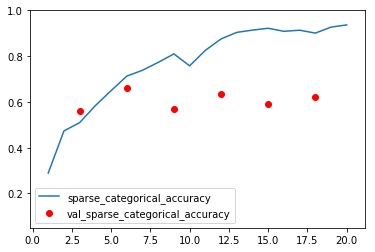

In [33]:
nn_trainplot_history(model_no_transfer, "sparse_categorical_accuracy", stride=3)

In [0]:
# Save the model (json) + weights
def nn_model_save(model):
  model_json = model.to_json()
  with open(model.name+".json", "w") as json_file:
    json_file.write(model_json)
  model.save_weights(model.name+".h5")
  print(f"{model.name} saved to disk")

In [27]:
nn_model_save(model_no_transfer)

model_no_transfer_1 saved to disk


#### **** As can be expected, model starts overfitting very early due to a lack of regularization. Let's use the same model with some dropout and L1 + L2 before output. ****

#### Model 2. The same 3-layer conv + 1-layer dense structure + regularization

In [0]:
# Make model
model_no_transfer_2 = make_model_no_transfer(
  n_classes=data_df.label.nunique(),
  n_conv_layers=3,
  conv_depths=[64,64,64],
  input_shape=IMG_DIMS + (3,),
  dropout=0.4,
  l1=3e-6,
  l2=3e-4,
  name="model_no_transfer_2"
)

In [32]:
# Train model
train_model(
  model=model_no_transfer_2,
  optimizer=keras.optimizers.Adam,
  lr=1e-4,
  epochs=21,
  easing_epochs=0,
  callbacks=False
)

Epoch 1/21
357/357 [==============================] - 56s 158ms/step - loss: 2.5152 - sparse_categorical_accuracy: 0.1382
Epoch 2/21
357/357 [==============================] - 51s 142ms/step - loss: 2.0904 - sparse_categorical_accuracy: 0.3204
Epoch 3/21
357/357 [==============================] - 72s 201ms/step - loss: 1.6863 - sparse_categorical_accuracy: 0.4375 - val_loss: 1.5135 - val_sparse_categorical_accuracy: 0.4726
Epoch 4/21
357/357 [==============================] - 40s 113ms/step - loss: 1.4525 - sparse_categorical_accuracy: 0.5246
Epoch 5/21
357/357 [==============================] - 52s 145ms/step - loss: 1.2824 - sparse_categorical_accuracy: 0.5860
Epoch 6/21
357/357 [==============================] - 70s 197ms/step - loss: 1.1291 - sparse_categorical_accuracy: 0.6372 - val_loss: 1.0757 - val_sparse_categorical_accuracy: 0.6916
Epoch 7/21
357/357 [==============================] - 41s 116ms/step - loss: 1.0403 - sparse_categorical_accuracy: 0.6600
Epoch 8/21
357/357 [====

Plot results

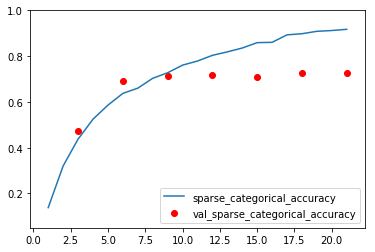

In [33]:
nn_trainplot_history(model_no_transfer_2, "sparse_categorical_accuracy", stride=3)

In [34]:
nn_model_save(model_no_transfer_2)

model_no_transfer_2 saved to disk


#### **** Ok, things look a little bit better (validation acc increased from 62% to 72%). Still overfitting a lot - let's reduce this without regularization: <br>

1. Remove the extra dense layer at the end (use more conv layers instead, fewer parameters)
2. To accommodate more conv layers, use full image size
3. Use smaller kernels for convolutions to capture details better
4. Increase augmentation (add flips) 

#### Model 3. Reduced model - no extra dense layer, extra conv layer (64,64,128,256), smaller conv kernels, full image size (299*299px) 

In [0]:
# Make reduced model
def make_model_no_transfer_rducd(
  n_classes,
  n_conv_layers,
  conv_depths,
  input_shape,
  name,
  dropout,
  l1,
  l2,
):
  
  model = keras.models.Sequential(name=name)
  model.add(keras.Input(shape=input_shape))
  model.add(keras.layers.Conv2D(conv_depths[0], (3,3), strides=(1,1)),
           )
  model.add(keras.layers.BatchNormalization(axis=3))
  model.add(keras.layers.Activation('relu'))
  model.add(keras.layers.MaxPooling2D((2,2)))
  
  if n_conv_layers > 1:
    for i in range(n_conv_layers-1):
      model.add(keras.layers.Conv2D(conv_depths[i+1], (3,3), strides=(1,1)))
      model.add(keras.layers.BatchNormalization(axis=3))
      model.add(keras.layers.Activation('relu'))
      model.add(keras.layers.MaxPooling2D((2,2)))

  model.add(keras.layers.Flatten())
  model.add(keras.layers.BatchNormalization())
  model.add(keras.layers.Dropout(dropout))
  model.add(keras.layers.Dense(
    n_classes,
    kernel_regularizer=keras.regularizers.l1_l2(l1, l2),
    activation=keras.activations.softmax))
    
  return model

In [0]:
# Reprocess the training and validation data (299*299)

IMG_DIMS=(299, 299)

train_dataset, train_dataset_length, train_batch_size = prepare_ds(
  df=train_df,
    x=image_path_col,
    y=target_col,
    batch_size=8,
    parse_fn=image_parse,
    augment_fn=partial(augment, level=3, flips="both"),
    mode="stretch",
    shuffle=True,
    prefetch=1,
    num_parallel_calls=-1,    
)

val_dataset, val_dataset_length, val_batch_size = prepare_ds(
  df=val_df,
    x=image_path_col,
    y=target_col,
    batch_size=8,
    parse_fn=image_parse,
    augment_fn=augment,
    mode="stretch",
    shuffle=False,
    prefetch=1,
    num_parallel_calls=-1,    
)

model_no_transfer_3 = make_model_no_transfer_rducd(
  n_classes=data_df.label.nunique(),
  n_conv_layers=4,
  conv_depths=[64,64,128,256],
  input_shape=IMG_DIMS + (3,),
  dropout=0.4,
  l1=3e-6,
  l2=3e-4,
  name="model_no_transfer_3"
)

In [47]:
# Train model
train_model(
  model=model_no_transfer_3,
  optimizer=keras.optimizers.Adam,
  lr=1e-4,
  epochs=21,
  easing_epochs=0,
  callbacks=False
)

Epoch 1/21
357/357 [==============================] - 97s 271ms/step - loss: 2.2191 - sparse_categorical_accuracy: 0.2333
Epoch 2/21
357/357 [==============================] - 88s 247ms/step - loss: 1.7111 - sparse_categorical_accuracy: 0.4193
Epoch 3/21
357/357 [==============================] - 117s 326ms/step - loss: 1.5879 - sparse_categorical_accuracy: 0.4435 - val_loss: 1.5169 - val_sparse_categorical_accuracy: 0.4442
Epoch 4/21
357/357 [==============================] - 74s 207ms/step - loss: 1.4511 - sparse_categorical_accuracy: 0.5018
Epoch 5/21
357/357 [==============================] - 89s 250ms/step - loss: 1.2904 - sparse_categorical_accuracy: 0.5747
Epoch 6/21
357/357 [==============================] - 114s 319ms/step - loss: 1.1924 - sparse_categorical_accuracy: 0.6091 - val_loss: 1.1230 - val_sparse_categorical_accuracy: 0.6368
Epoch 7/21
357/357 [==============================] - 75s 211ms/step - loss: 1.1194 - sparse_categorical_accuracy: 0.6239
Epoch 8/21
357/357 [==

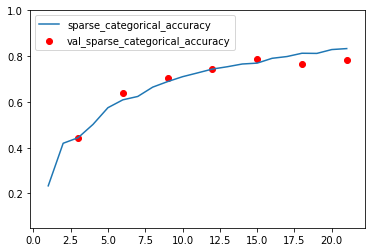

In [48]:
nn_trainplot_history(model_no_transfer_3, "sparse_categorical_accuracy", stride=3)

In [49]:
nn_model_save(model_no_transfer_3)

model_no_transfer_3 saved to disk


#### **** Better! Validation accuracy from 72% to 78% and no more overfitting. Let's use more guns, add more layers, make them larger. ****

#### Model 4. 6-conv layers (128,256,256,256,256,256) + regularization

In [0]:
model_no_transfer_4 = make_model_no_transfer_rducd(
  n_classes=data_df.label.nunique(),
  n_conv_layers=6,
  conv_depths=[128,256,256,256,256,256],
  input_shape=IMG_DIMS + (3,),
  dropout=0.4,
  l1=3e-6,
  l2=3e-6,
  name="model_no_transfer_4"
)

In [39]:
train_model(
  model=model_no_transfer_4,
  optimizer=keras.optimizers.Adam,
  lr=3e-4,
  epochs=39,
  easing_epochs=0,
  callbacks=False
)

Epoch 1/39
357/357 [==============================] - 177s 495ms/step - loss: 2.3683 - sparse_categorical_accuracy: 0.1811
Epoch 2/39
357/357 [==============================] - 165s 463ms/step - loss: 1.9099 - sparse_categorical_accuracy: 0.3263
Epoch 3/39
357/357 [==============================] - 199s 558ms/step - loss: 1.7228 - sparse_categorical_accuracy: 0.4039 - val_loss: 1.4578 - val_sparse_categorical_accuracy: 0.4789
Epoch 4/39
357/357 [==============================] - 147s 412ms/step - loss: 1.5459 - sparse_categorical_accuracy: 0.4621
Epoch 5/39
357/357 [==============================] - 167s 468ms/step - loss: 1.3389 - sparse_categorical_accuracy: 0.5407
Epoch 6/39
357/357 [==============================] - 196s 549ms/step - loss: 1.1732 - sparse_categorical_accuracy: 0.6053 - val_loss: 0.9401 - val_sparse_categorical_accuracy: 0.6895
Epoch 7/39
357/357 [==============================] - 149s 418ms/step - loss: 1.0621 - sparse_categorical_accuracy: 0.6404
Epoch 8/39
357/35

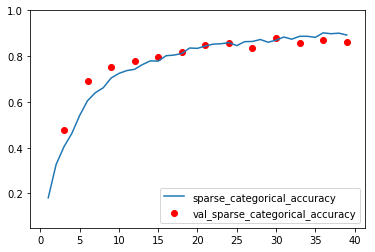

In [42]:
nn_trainplot_history(model_no_transfer_4, "sparse_categorical_accuracy", stride=3)

In [44]:
nn_model_save(model_no_transfer_4)

model_no_transfer_4 saved to disk


In [0]:
model_no_transfer_4.load_weights("model_no_transfer_4.h5")

#### Let's do the final steps with SGD

In [32]:
train_model(
  model=model_no_transfer_4,
  optimizer=partial(keras.optimizers.SGD, nesterov=True),
  lr=1e-2,
  epochs=21,
  easing_epochs=0,
  callbacks=True
)

Epoch 1/21
357/357 [==============================] - 121s 339ms/step - loss: 1.0097 - sparse_categorical_accuracy: 0.8758 - val_loss: 0.6358 - val_sparse_categorical_accuracy: 0.9284
Epoch 2/21
357/357 [==============================] - 101s 282ms/step - loss: 0.9417 - sparse_categorical_accuracy: 0.8846 - val_loss: 0.6365 - val_sparse_categorical_accuracy: 0.9284
Epoch 3/21
357/357 [==============================] - 99s 277ms/step - loss: 0.9550 - sparse_categorical_accuracy: 0.8863 - val_loss: 0.6259 - val_sparse_categorical_accuracy: 0.9232
Epoch 4/21
357/357 [==============================] - 100s 280ms/step - loss: 0.9688 - sparse_categorical_accuracy: 0.8825 - val_loss: 0.6354 - val_sparse_categorical_accuracy: 0.9263
Epoch 5/21
357/357 [==============================] - 99s 277ms/step - loss: 0.8523 - sparse_categorical_accuracy: 0.8919 - val_loss: 0.6181 - val_sparse_categorical_accuracy: 0.9232
Epoch 6/21
357/357 [==============================] - 100s 279ms/step - loss: 0.86

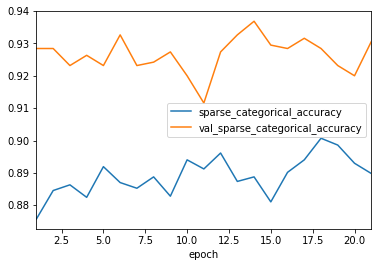

In [33]:
nn_trainplot_history(model_no_transfer_4, "sparse_categorical_accuracy")

#### **** Ok, 93% validation accuracy is good enough for now - we could improve that by playing around with learning rates more and letting it train longer. Let's move on to transfer learning. ****

#### Visualize activations of the final no-transfer model

In [0]:
layer_outputs = [layer.output for layer in model_no_transfer_4.layers[:12]] 
activation_model = keras.models.Model(inputs=model_no_transfer_4.input, outputs=layer_outputs) 

In [0]:
activations = activation_model.predict(train_dataset.take(1))

In [0]:
layer_names = []
for layer in model_no_transfer_4.layers[:12]:
    layer_names.append(layer.name)
images_per_row = 16

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in true_divide
  if sys.path[0] == '':


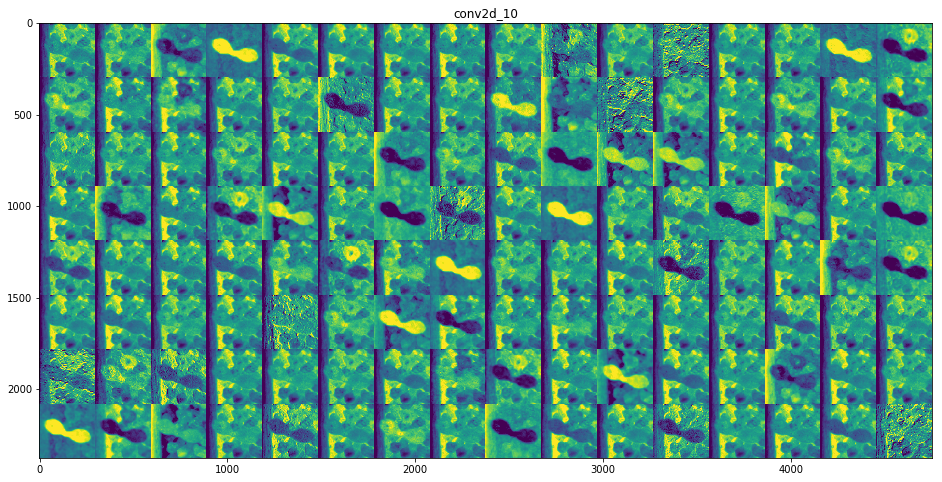

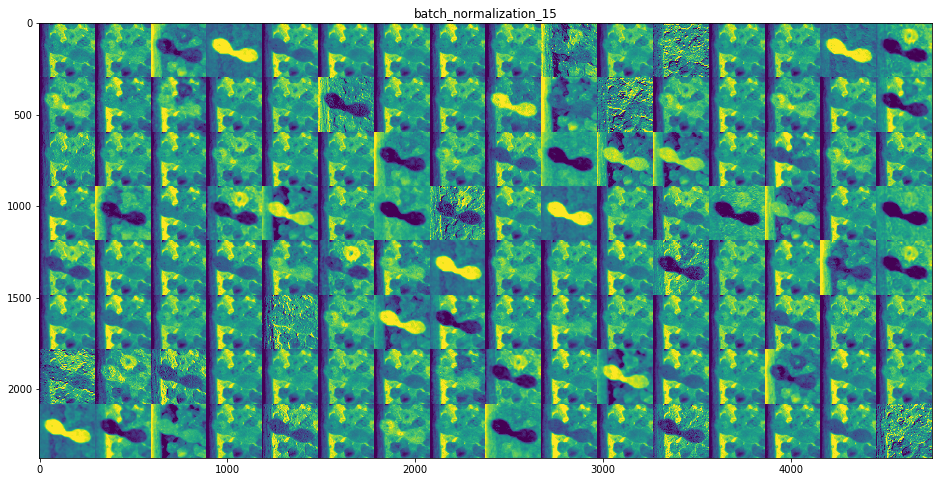

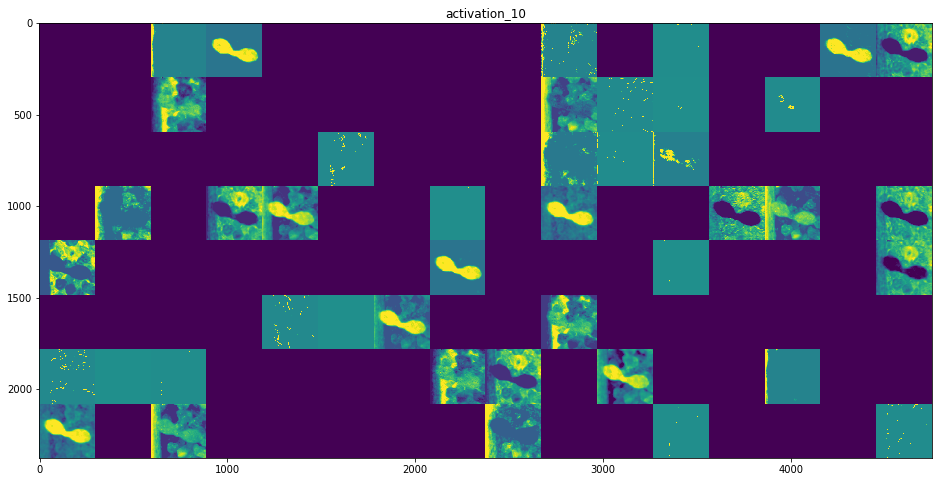

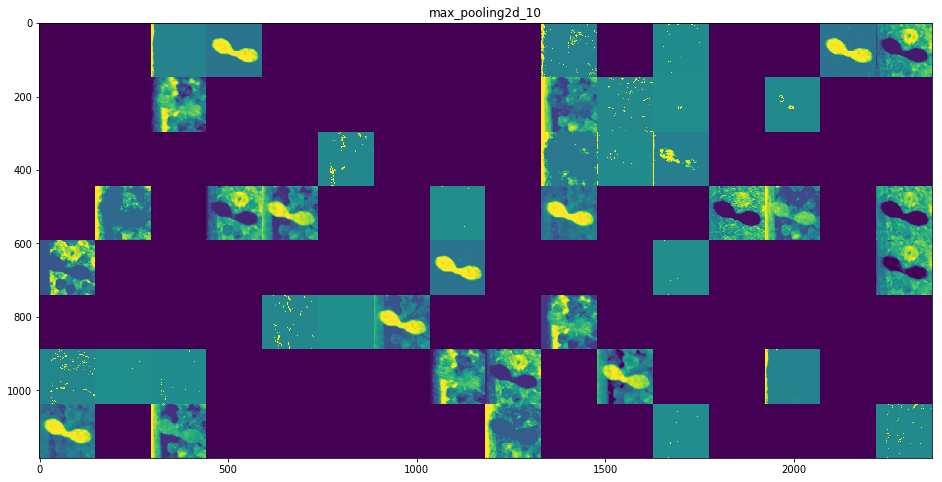

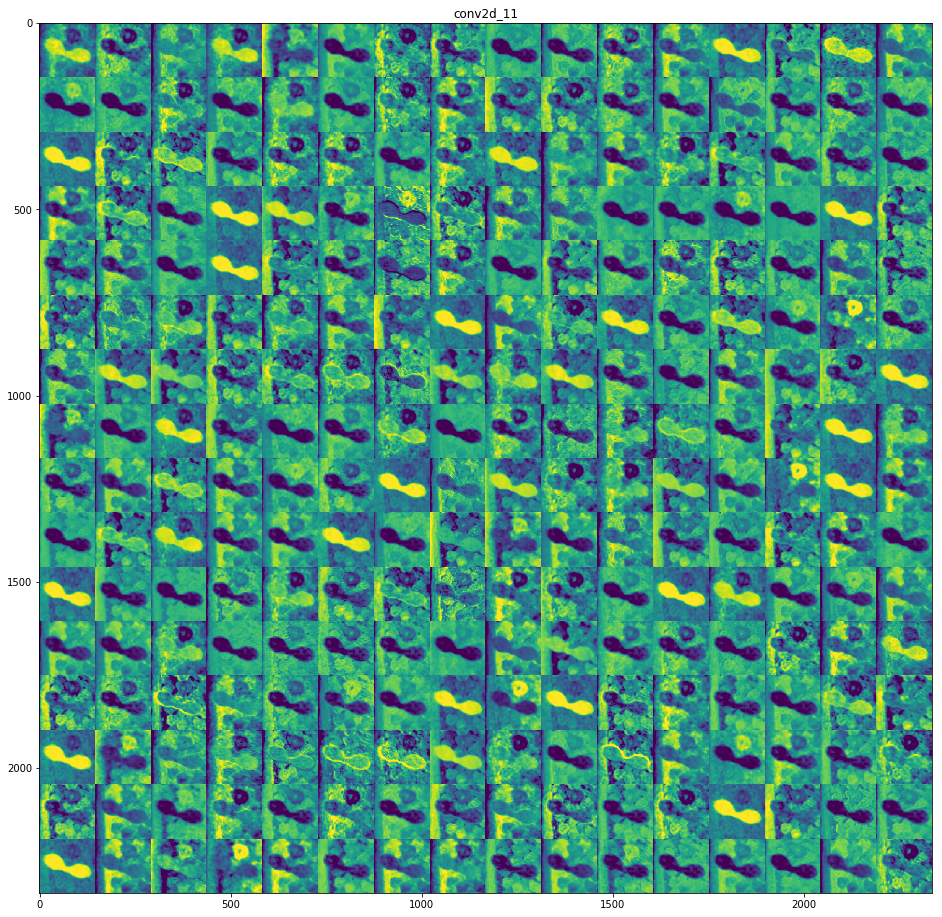

...

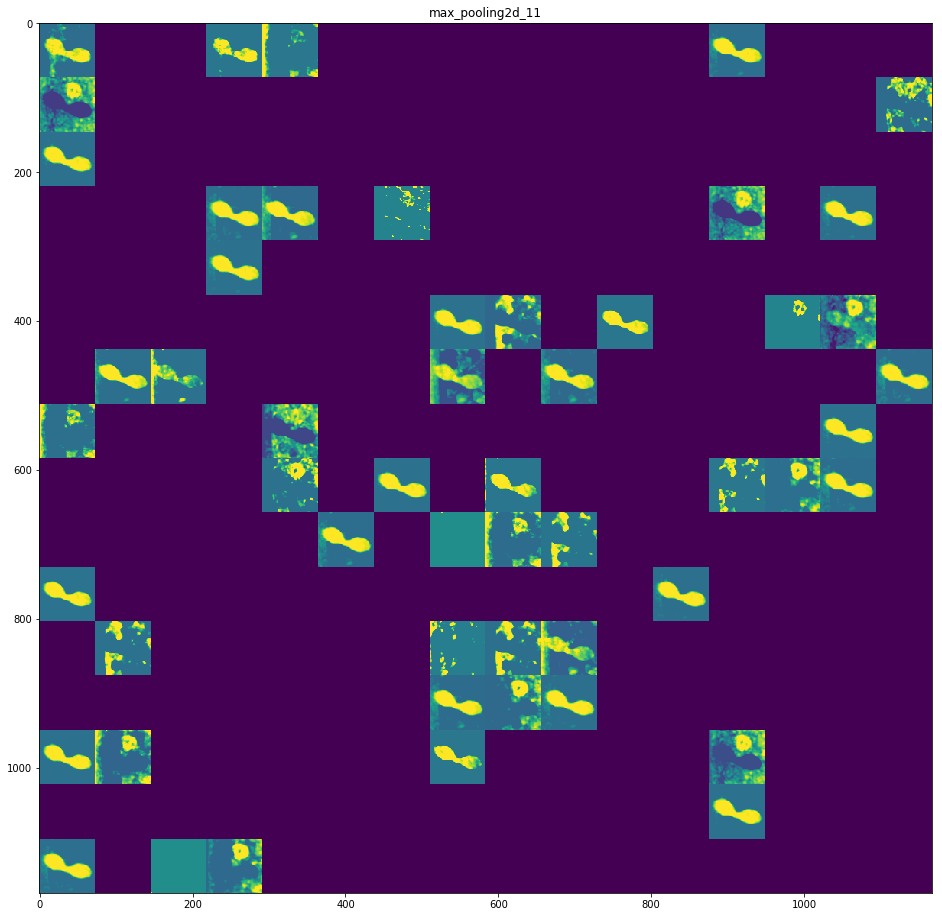

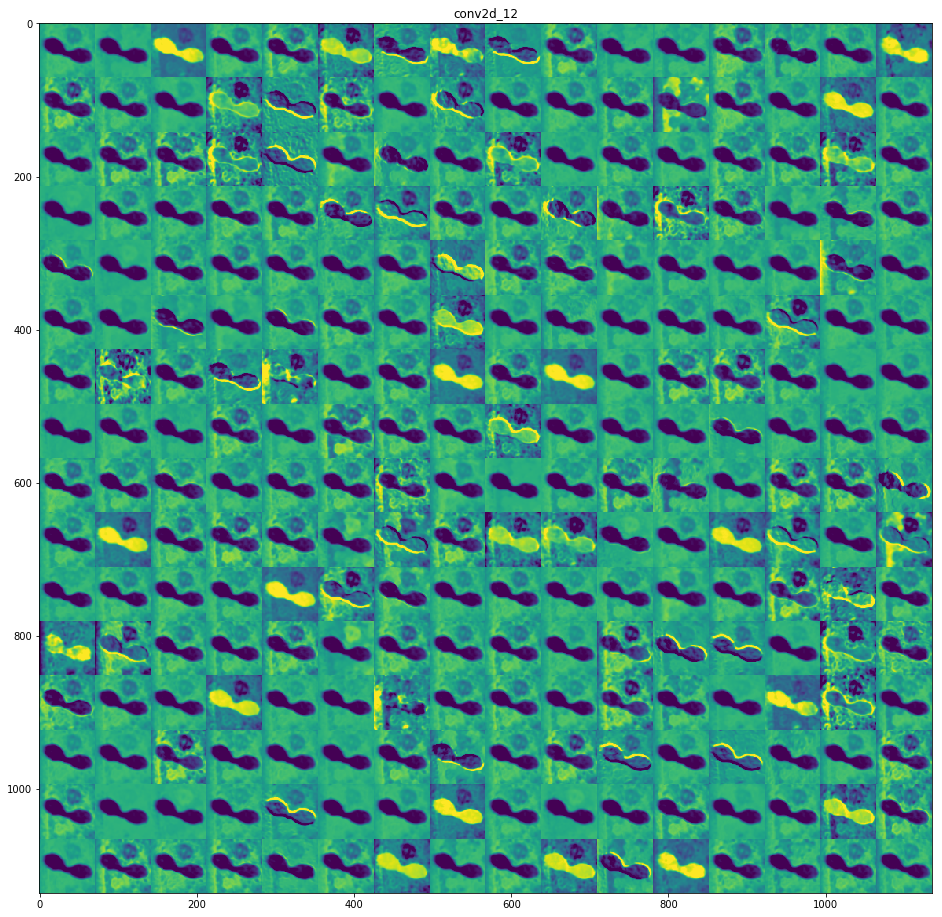

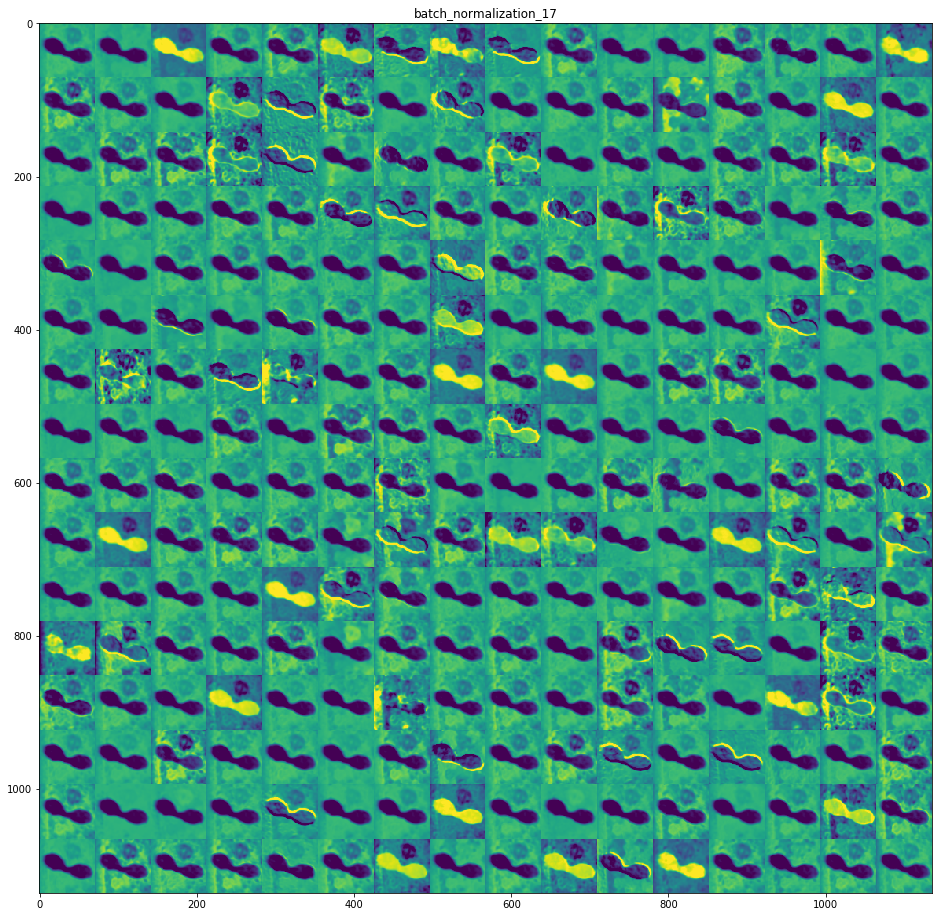

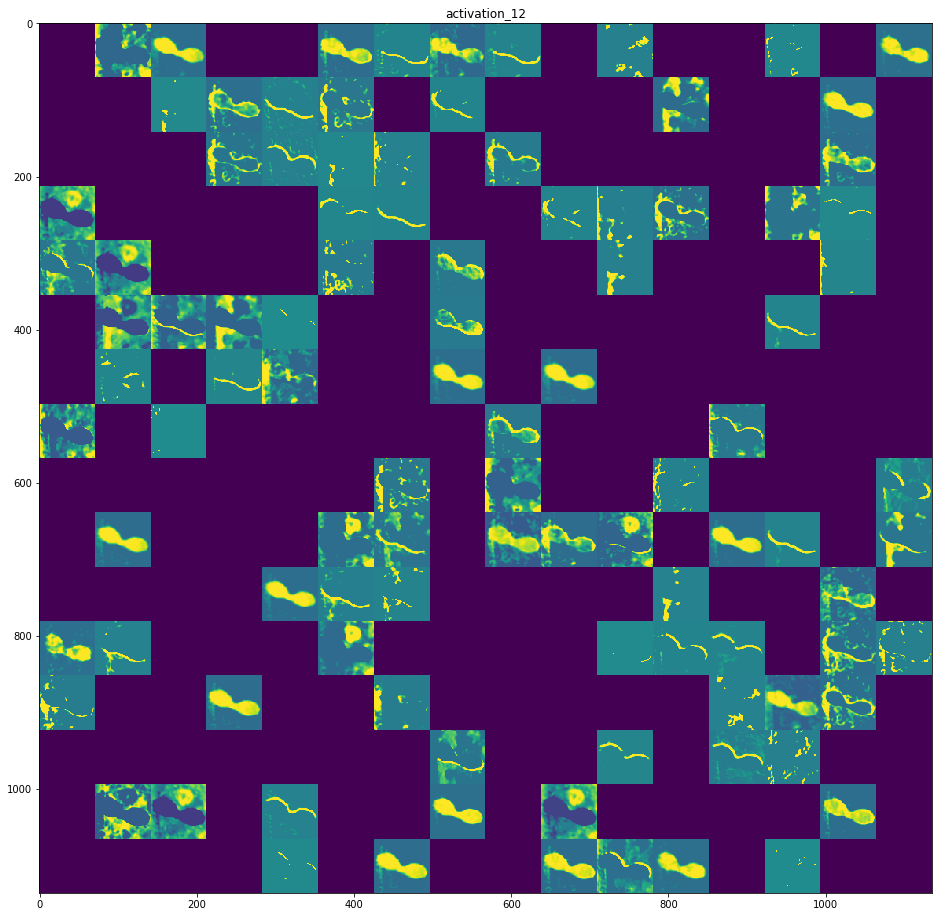

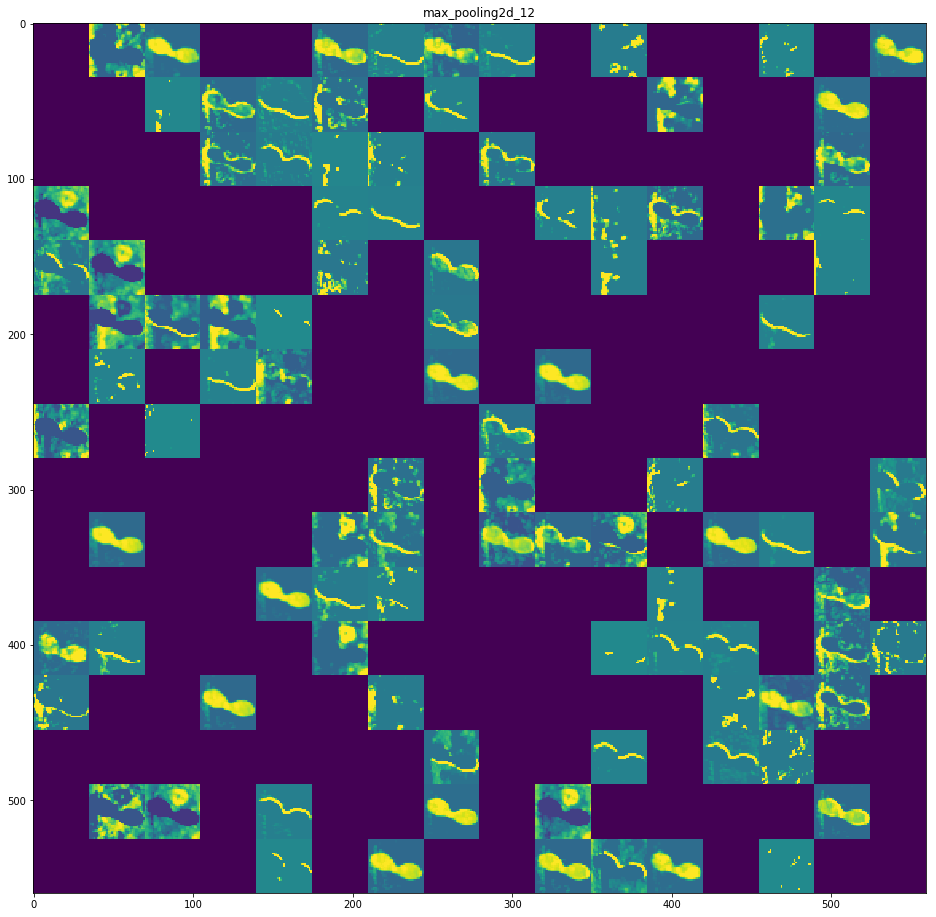

In [116]:
# Function source:
# https://github.com/gabrielpierobon/cnnshapes/blob/master/README.md
for layer_name, layer_activation in zip(layer_names, activations): 
    n_features = layer_activation.shape[-1] 
    size = layer_activation.shape[1] 
    n_cols = n_features // images_per_row 
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    for col in range(n_cols): 
        for row in range(images_per_row):
            channel_image = layer_activation[2,
                                             :, :,
                                             col * images_per_row + row]
            channel_image -= channel_image.mean() 
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size, # Displays the grid
                         row * size : (row + 1) * size] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

#### Model 5 (final). Transfer learning with Xception + Extra dense layer before output (256)

10 epochs pre-training, 25 epochs training total

In [0]:
def make_model_transfer(
  n_classes,
  input_shape,
  dropout,
  l1,
  l2,
  name,
):
  base_model = keras.applications.Xception(include_top=False, 
                                           input_shape=input_shape,
                                          )
  
  x = keras.layers.concatenate([
      keras.layers.GlobalAvgPool2D()(base_model.output),
      keras.layers.GlobalMaxPool2D()(base_model.output),
  ])
  x = keras.layers.BatchNormalization()(x)
  x = keras.layers.Dropout(dropout[0])(x)
  x = keras.layers.Dense(256, 
                         kernel_regularizer=keras.regularizers.l1_l2(l1, l2),
                         activation="relu")(x)
  x = keras.layers.BatchNormalization()(x)
  x = keras.layers.Dropout(dropout[1])(x)
  x = keras.layers.Dense(
    n_classes,
    activation=keras.activations.softmax)(x)
  
  return keras.Model(inputs=base_model.inputs, outputs=x, name=name)

In [0]:
IMG_DIMS=(299, 299)

train_dataset, train_dataset_length, train_batch_size = prepare_ds(
  df=train_df,
    x=image_path_col,
    y=target_col,
    batch_size=8,
    parse_fn=image_parse,
    augment_fn=partial(augment, level=3, flips="both"),
    mode="stretch",
    shuffle=True,
    prefetch=1,
    num_parallel_calls=-1,    
)

val_dataset, val_dataset_length, val_batch_size = prepare_ds(
  df=val_df,
    x=image_path_col,
    y=target_col,
    batch_size=8,
    parse_fn=image_parse,
    augment_fn=augment,
    mode="stretch",
    shuffle=False,
    prefetch=1,
    num_parallel_calls=-1,    
)

model_transfer_1 = make_model_transfer(
  n_classes=data_df.label.nunique(),
  input_shape=IMG_DIMS + (3,),
  dropout=[0.3, 0.5],
  l1=1e-4,
  l2=3e-3,
  name="model_transfer_1",
)

In [39]:
train_model(
  model=model_transfer_1,
  optimizer=keras.optimizers.Adam,
  lr=1e-4,
  epochs=5,
  easing_epochs=0,
  callbacks=True
)

Epoch 1/5
357/357 [==============================] - 386s 1s/step - loss: 1.0121 - sparse_categorical_accuracy: 0.9470 - val_loss: 0.8431 - val_sparse_categorical_accuracy: 0.9789
Epoch 2/5
357/357 [==============================] - 291s 815ms/step - loss: 0.9118 - sparse_categorical_accuracy: 0.9498 - val_loss: 0.7867 - val_sparse_categorical_accuracy: 0.9789
Epoch 3/5
357/357 [==============================] - 303s 849ms/step - loss: 0.8170 - sparse_categorical_accuracy: 0.9593 - val_loss: 0.7548 - val_sparse_categorical_accuracy: 0.9800
Epoch 4/5
357/357 [==============================] - 304s 852ms/step - loss: 0.7512 - sparse_categorical_accuracy: 0.9656 - val_loss: 0.6712 - val_sparse_categorical_accuracy: 0.9842
Epoch 5/5
357/357 [==============================] - 306s 858ms/step - loss: 0.6881 - sparse_categorical_accuracy: 0.9705 - val_loss: 0.6304 - val_sparse_categorical_accuracy: 0.9811


In [25]:
nn_model_save(model_transfer_1)

model_transfer_1 saved to disk


#### **** Ok, so this is much better almost straight out of the box, after only some tinkering with Dense layer size and learning rate. Impressive! ****

## Final scoring of the best model on test data



In [0]:
IMG_DIMS=(299, 299)

test_dataset, test_dataset_length, test_batch_size = prepare_ds(
  df=test_df,
    x=image_path_col,
    y=target_col,
    batch_size=8,
    parse_fn=image_parse,
    augment_fn=augment,
    mode="stretch",
    shuffle=False,
    prefetch=1,
    num_parallel_calls=-1,    
)

In [0]:
predictions_transfer = model_transfer_1.predict(test_dataset, 
                                               steps=math.ceil(test_dataset_length/test_batch_size))

In [0]:
test_labels = np.concatenate([
    y.numpy() for _, y in test_dataset.take(math.ceil(test_dataset_length/test_batch_size))
])

In [76]:
print(classification_report(test_labels, predictions_transfer.argmax(axis=1)))

              precision    recall  f1-score   support

         0.0       0.97      0.99      0.98        77
         1.0       1.00      0.93      0.96        44
         2.0       0.99      1.00      0.99        78
         3.0       0.98      0.98      0.98       122
         4.0       0.98      1.00      0.99       103
         5.0       1.00      0.96      0.98        47
         6.0       1.00      0.98      0.99        99
         7.0       1.00      0.98      0.99        57
         8.0       0.95      0.94      0.94       131
         9.0       0.98      1.00      0.99        95
        10.0       0.84      0.87      0.85        53
        11.0       1.00      1.00      1.00        44

    accuracy                           0.97       950
   macro avg       0.97      0.97      0.97       950
weighted avg       0.97      0.97      0.97       950

